In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
from IPython.display import display
import importlib

In [9]:
## added through development

import numpy as np
from sklearn import cluster, mixture, manifold
import random

from matplotlib.pyplot import show
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py                                                                                                                                                                                         
import plotly.graph_objs as go
py.init_notebook_mode()

In [3]:
## all inputs

root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/"
db_file = root_dir + "DMEL.db"
las_file = root_dir + "TAN.DMEL.las"

datruf_result = root_dir + "datruf_result"
unit_seqs = root_dir + "datruf_units.fasta"
peaks_dir = root_dir + "peaks"

clustering_pickle = "hoge.pkl"

## TODO

* monover encoding
* assembly graph construction (from FALCON?)

-> read-vs-read overlap がちょうどいい感じに取れるかどうかが1つの大きなアルゴリズム評価基準になってくるので、先にグラフ構築まで基盤を整備しておきたい。

* alignment score by normalized transition probability? or exact matching by encoded reads?

In [4]:
from dacenter_viewer import *

In [46]:
# Reload module
import dacenter_run_peak
importlib.reload(dacenter_run_peak)
import dpmm
importlib.reload(dpmm)
#import dpmm_oldname
#importlib.reload(dpmm_oldname)
import dacenter_run_unit
importlib.reload(dacenter_run_unit)
import dacenter_viewer
importlib.reload(dacenter_viewer)
from dacenter_viewer import *

## Comparing with other methods

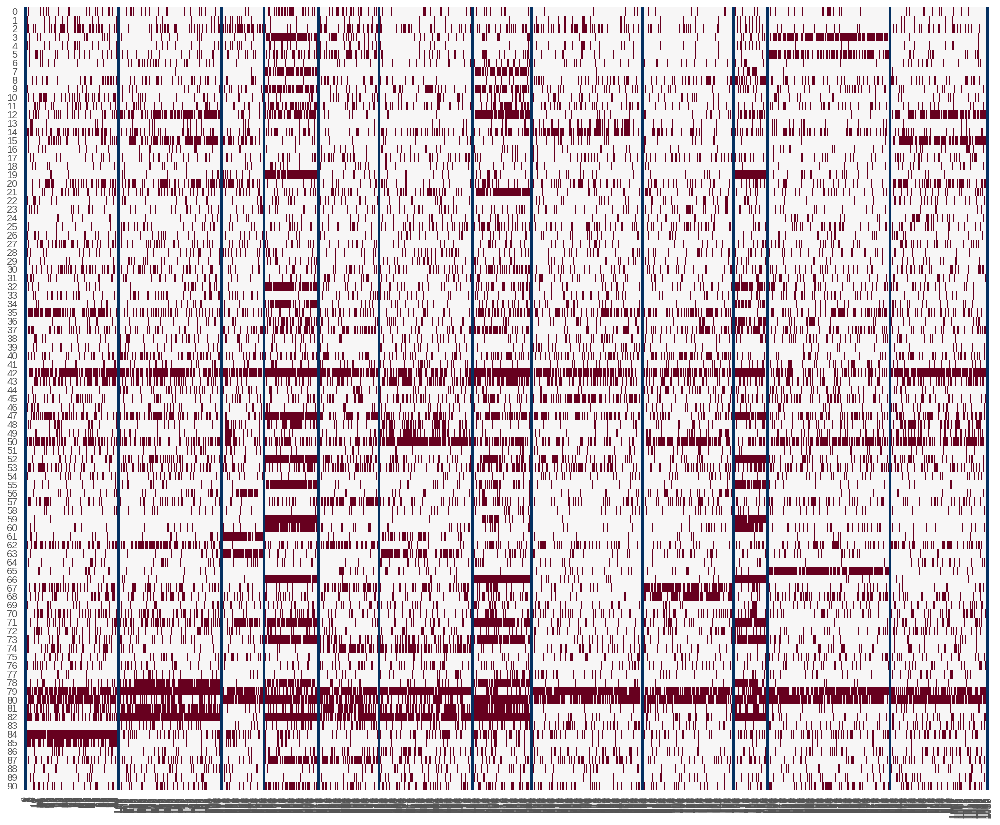

In [289]:
cv = ClusteringViewer("../datruf_run/dmel/test/gmm.pkl")
cv.heatmap_partition()

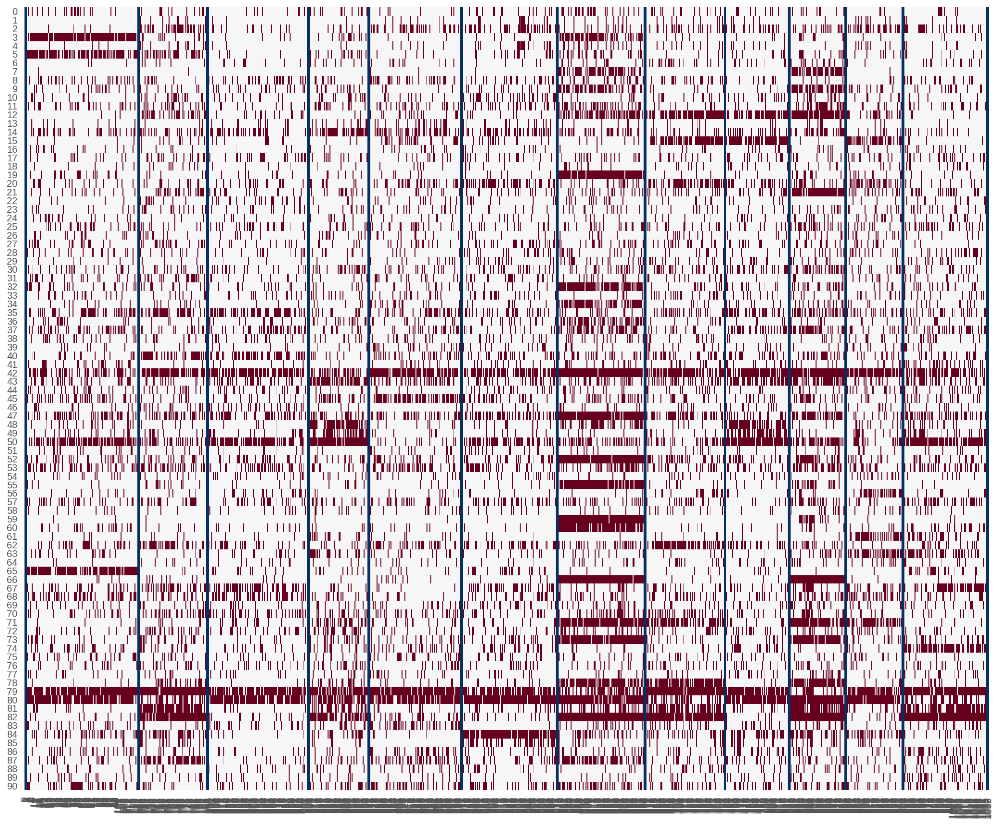

In [292]:
cv = ClusteringViewer("../datruf_run/dmel/test/kmeans.pkl")
cv.heatmap_partition()

-> どれもDPMMと変わらない良い結果(クラスター数は決められないが)

### Behavior of 2-split

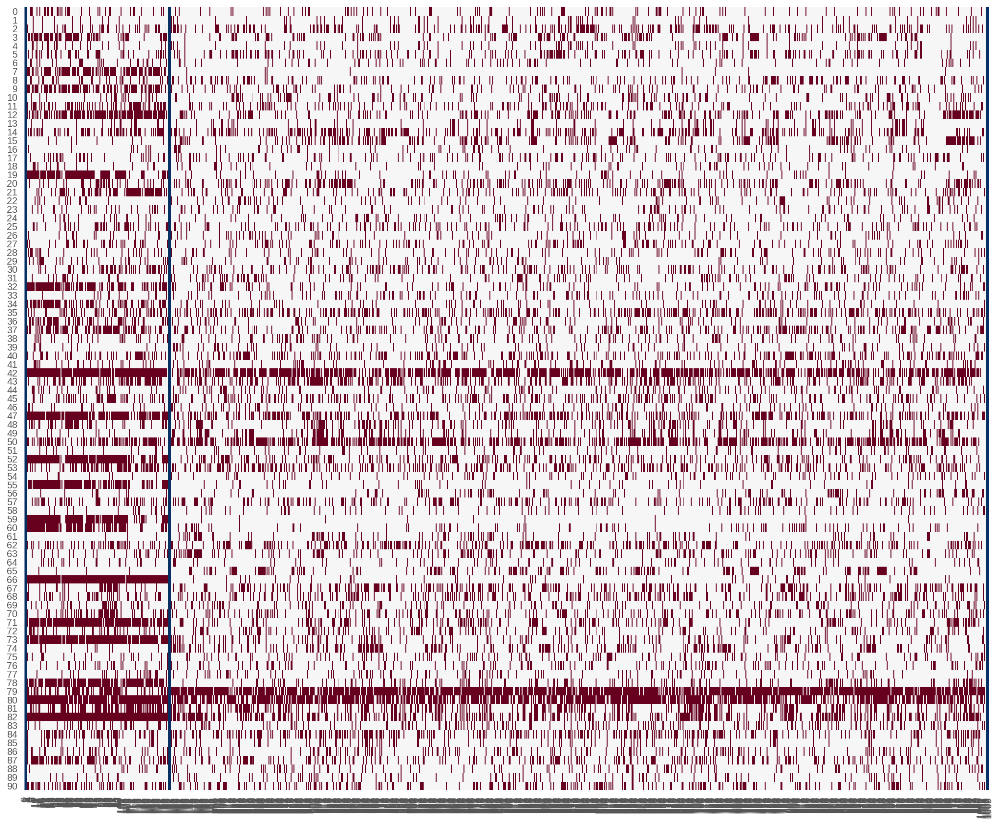

In [295]:
cv = ClusteringViewer("../datruf_run/dmel/test/kmeans.pkl")
cv.heatmap_partition()

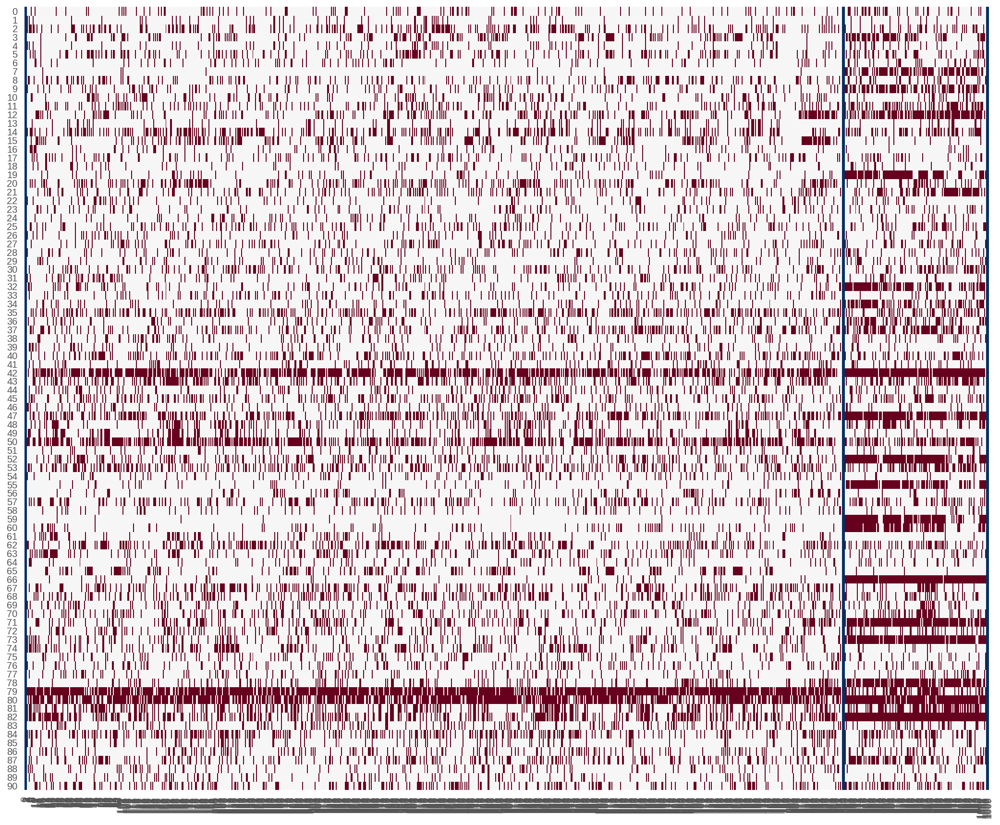

In [296]:
cv = ClusteringViewer("../datruf_run/dmel/test/gmm.pkl")
cv.heatmap_partition()

-> 2-splitはgmmとbirchが完全一致、kmeansもほぼ一致。

## Clustering plot with small dataset

In [268]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.pkl")

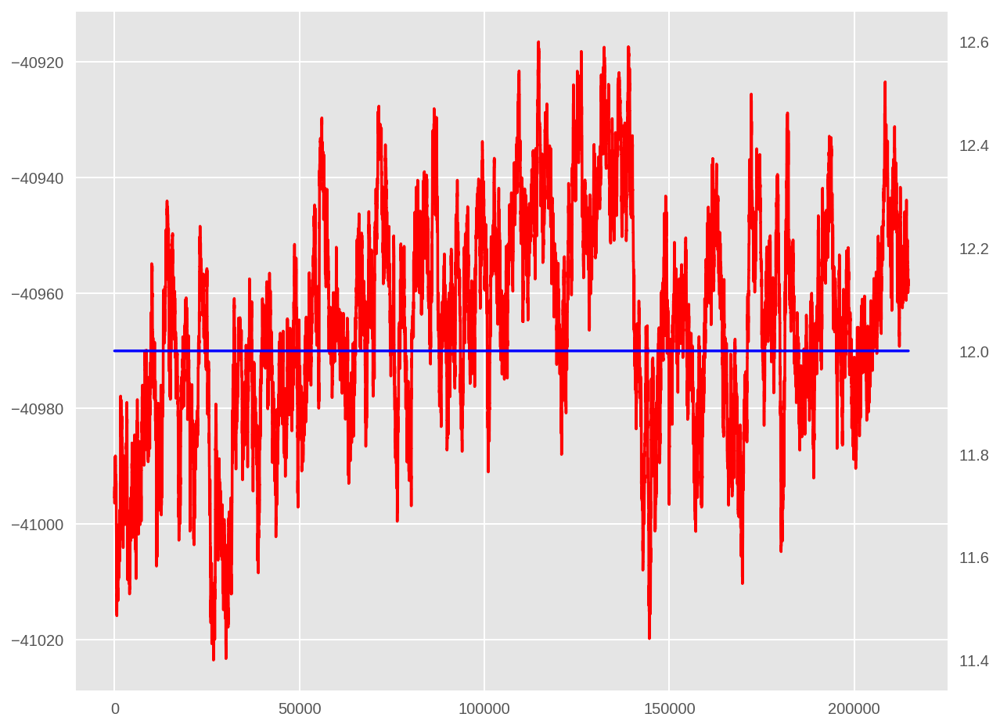

In [270]:
cv.plot_transition(start=50000)

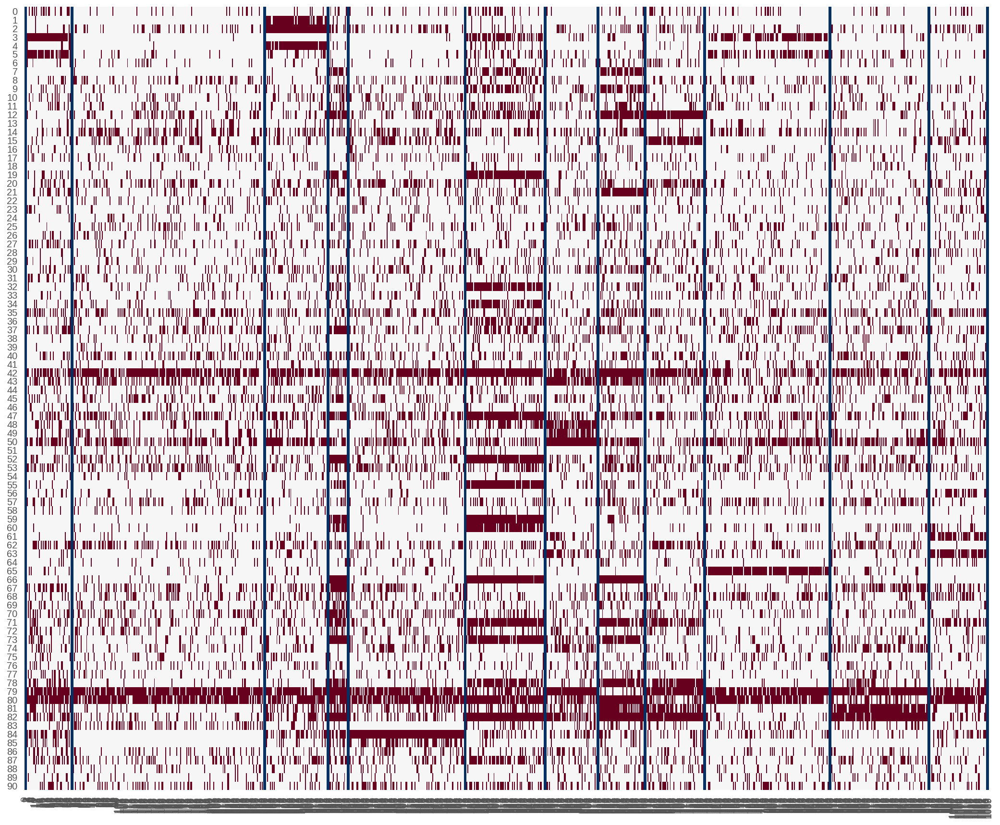

In [271]:
cv.heatmap_partition()

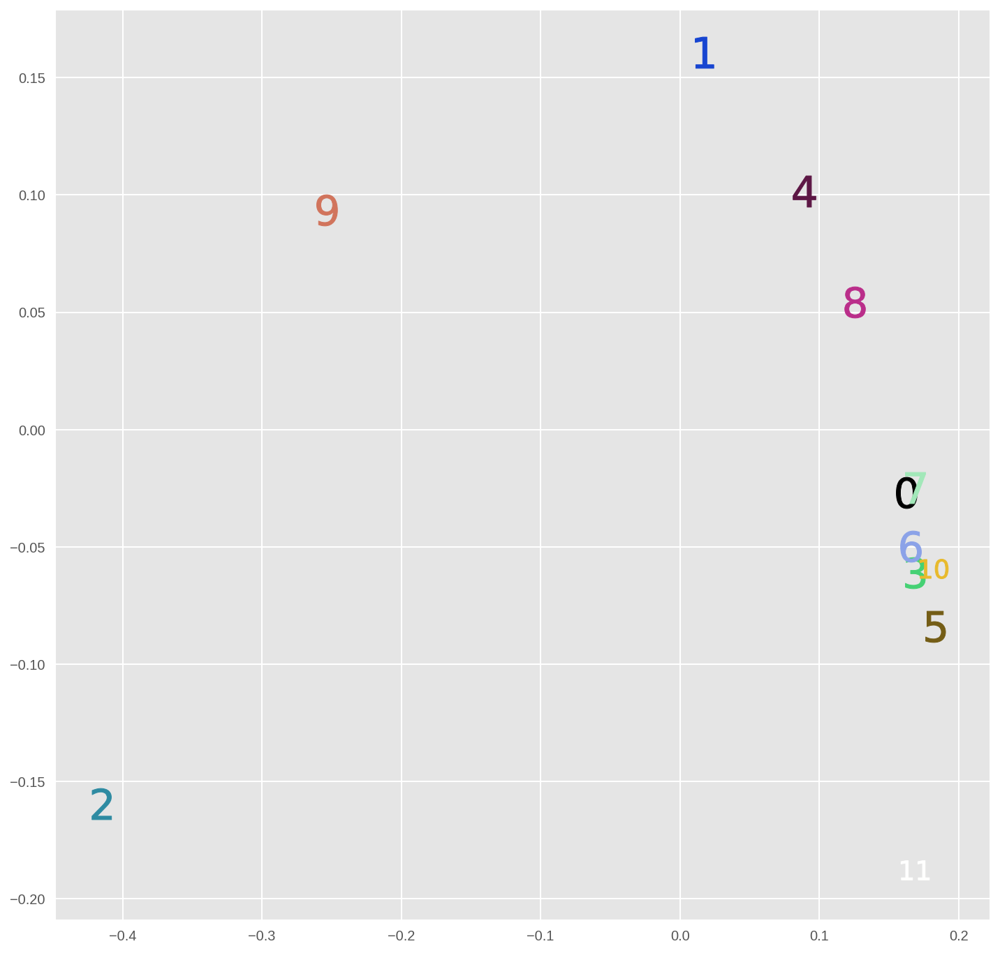

In [616]:
cv = ClusteringViewer("../datruf_run/dmel/test/gmm.pkl")
cv.clustering.generate_representative_units()
cv.scatter_units(only_representatives=True)

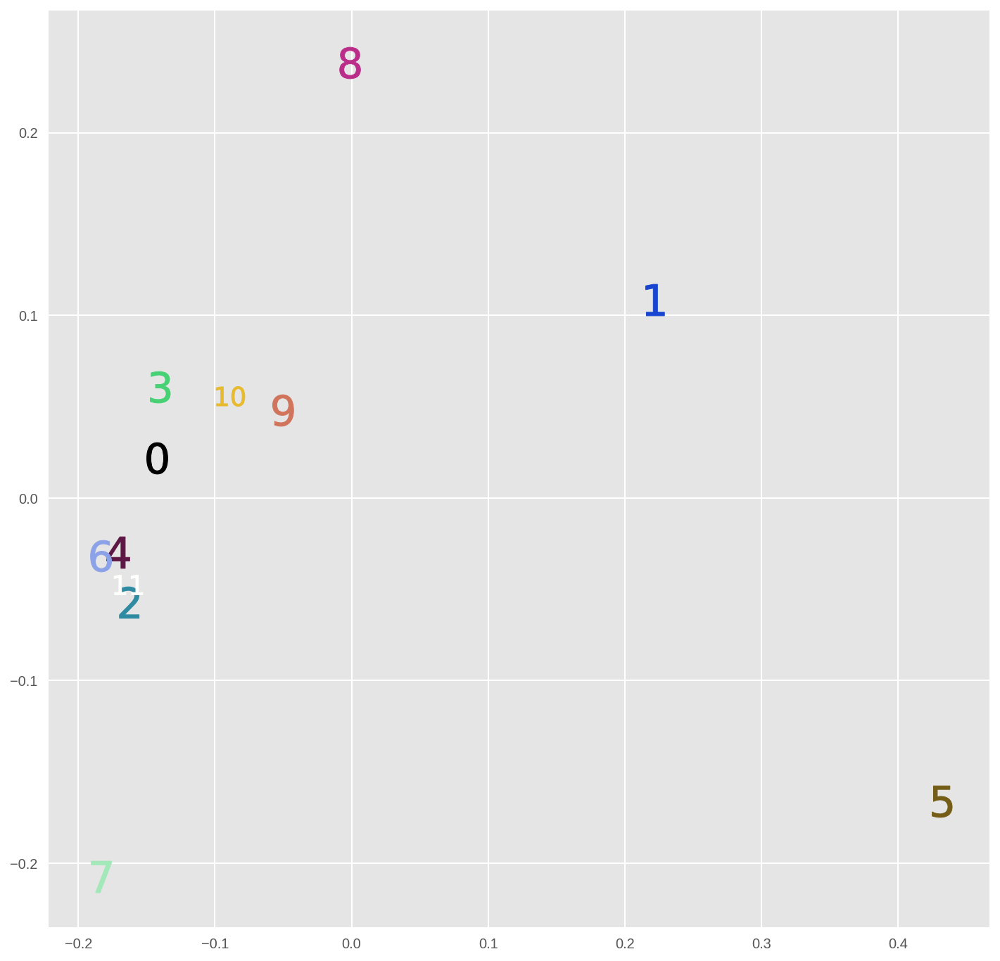

In [617]:
cv = ClusteringViewer("../datruf_run/dmel/test/kmeans.pkl")
cv.clustering.generate_representative_units()
cv.scatter_units(only_representatives=True)

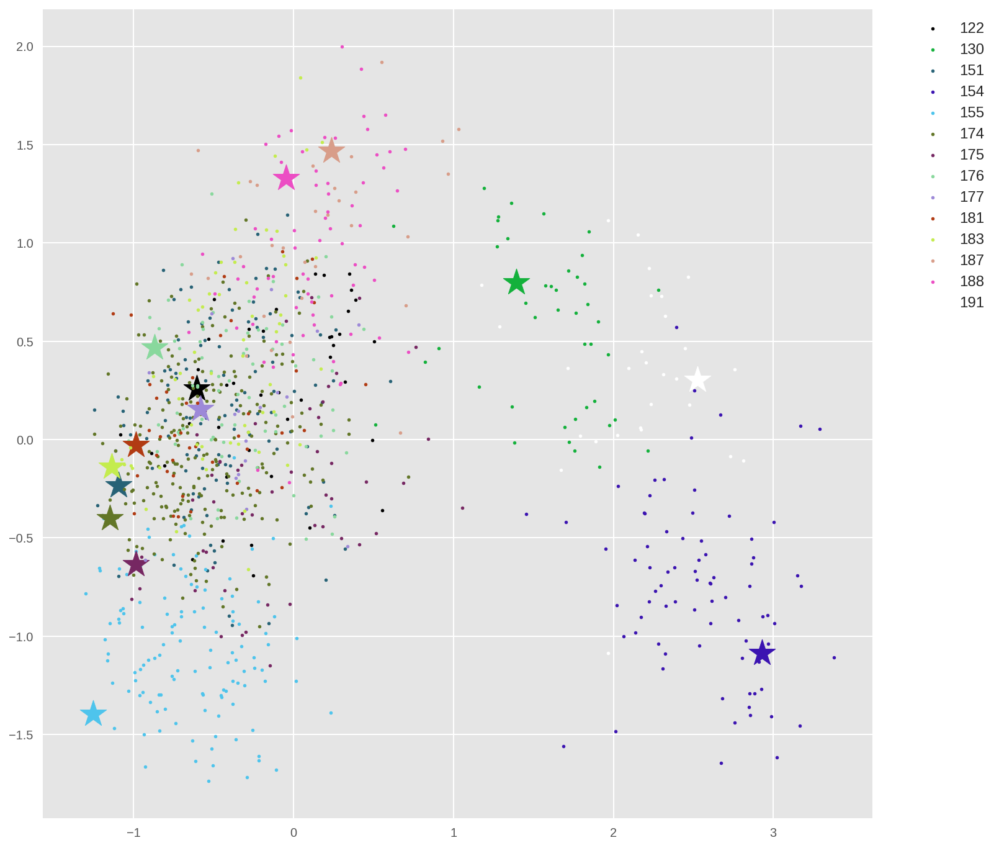

In [47]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.small.single_init.pkl")
cv.scatter_units(method="pca", only_representatives=False)

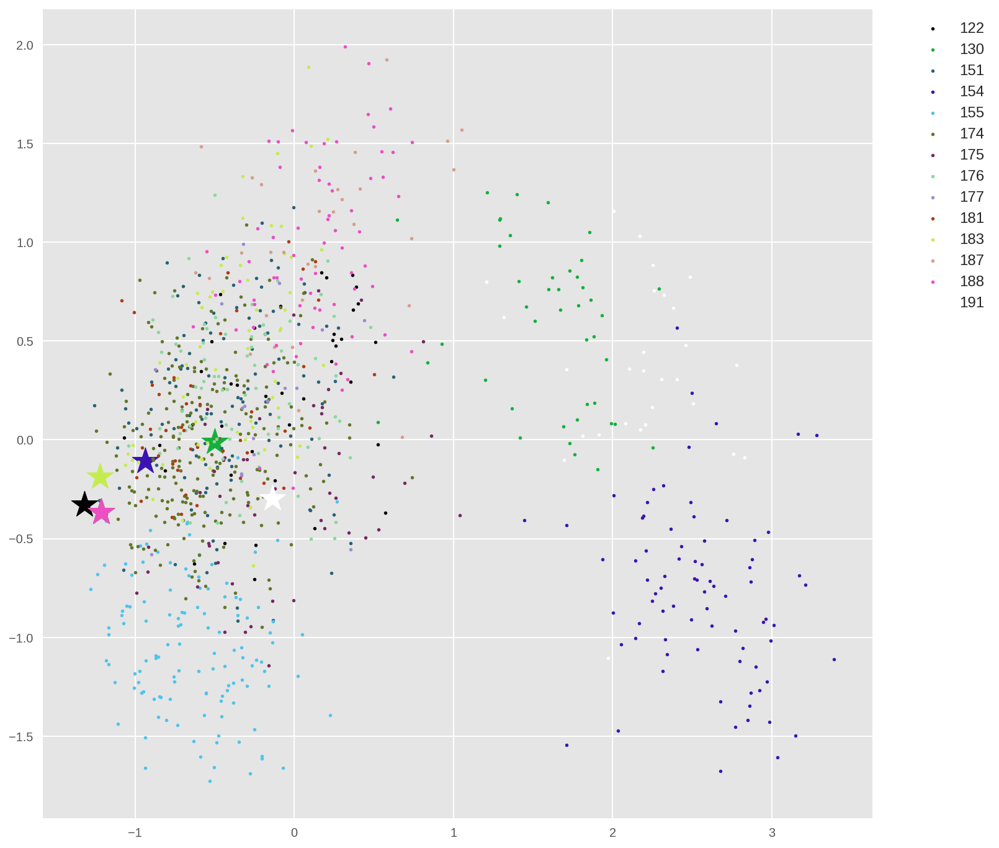

In [50]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.small.single_init.pkl")
cv.scatter_units(center="centroid", method="pca", only_representatives=False)

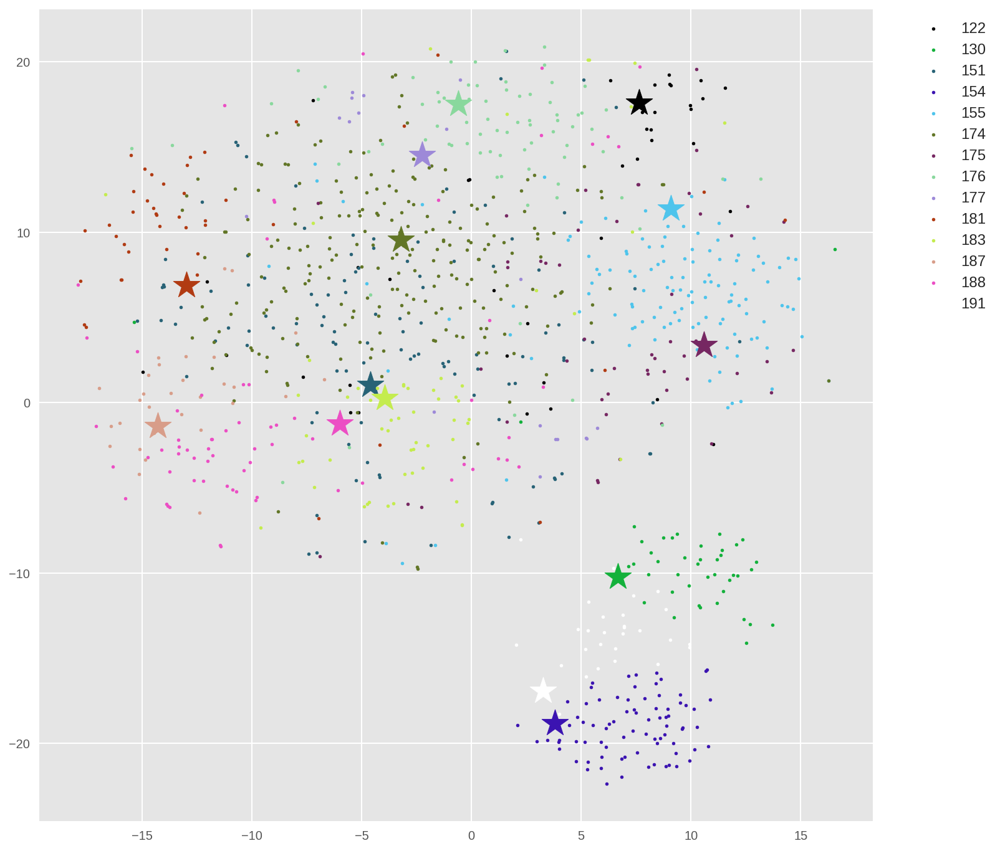

In [48]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.small.single_init.pkl")
cv.scatter_units(method="tsne", only_representatives=False)

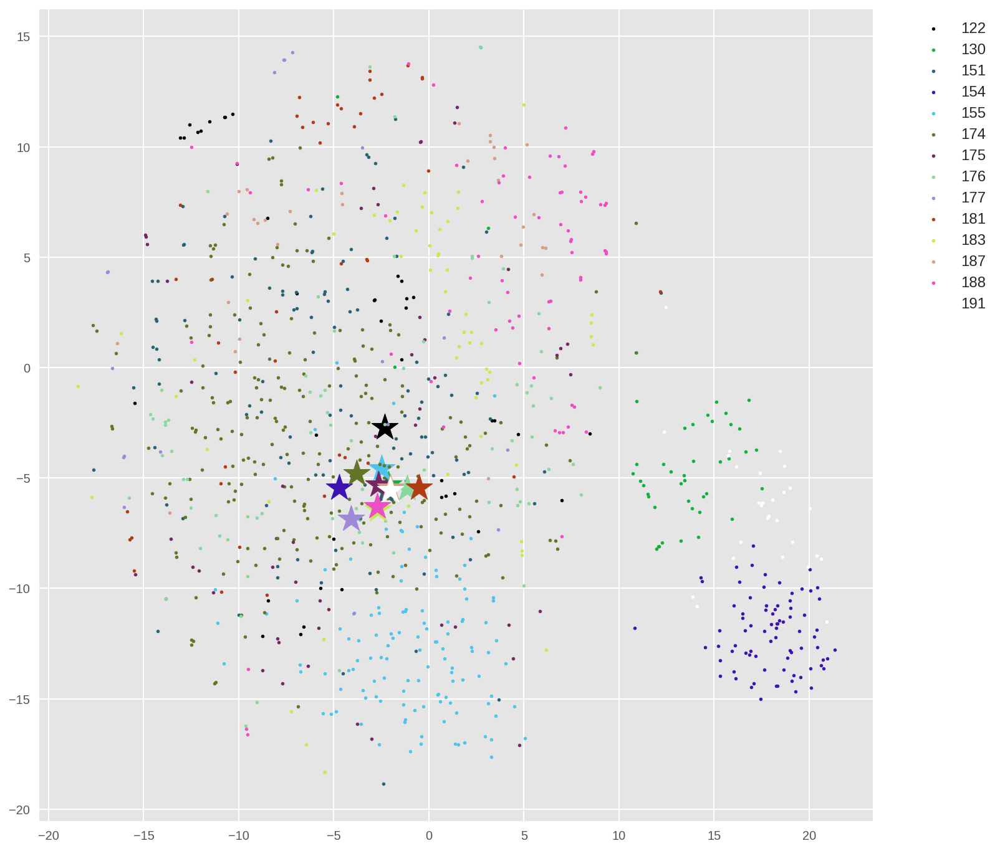

In [49]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.small.single_init.pkl")
cv.scatter_units(center="centroid", method="tsne", only_representatives=False)

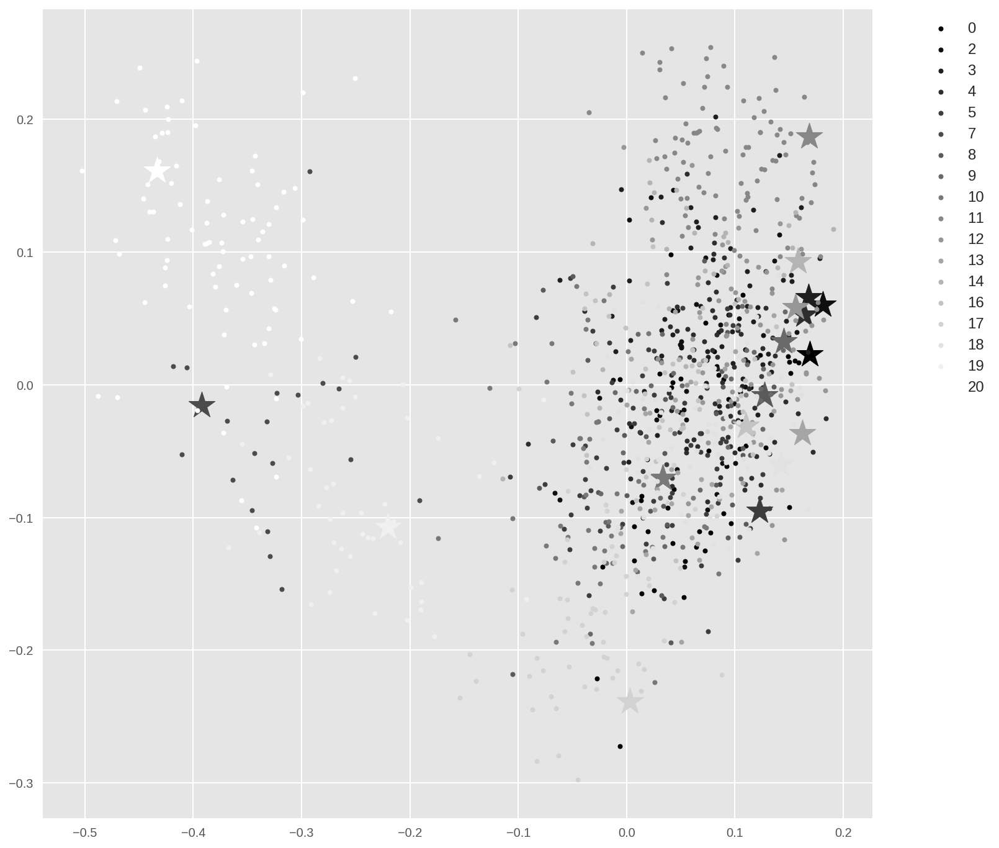

In [452]:
cv = ClusteringViewer("../datruf_run/dmel/test/dpmm.small.kmeans_init.pkl")
cv.clustering.generate_representative_units()
cv.scatter_units()

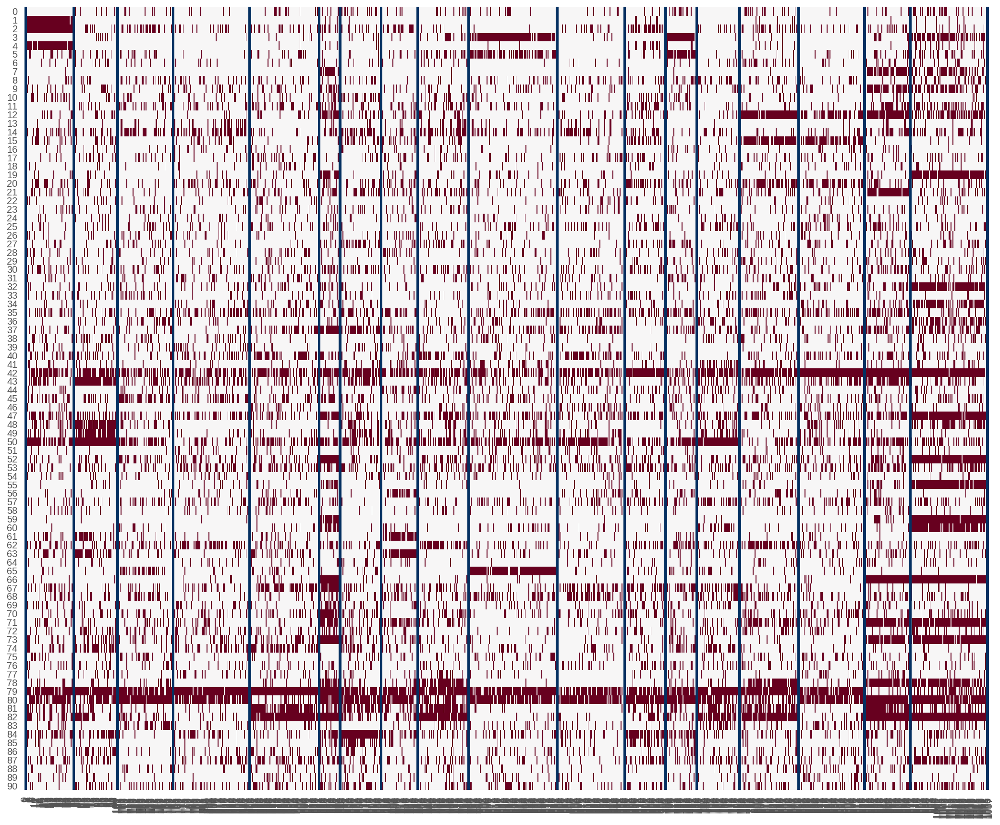

In [425]:
cv.heatmap_partition()

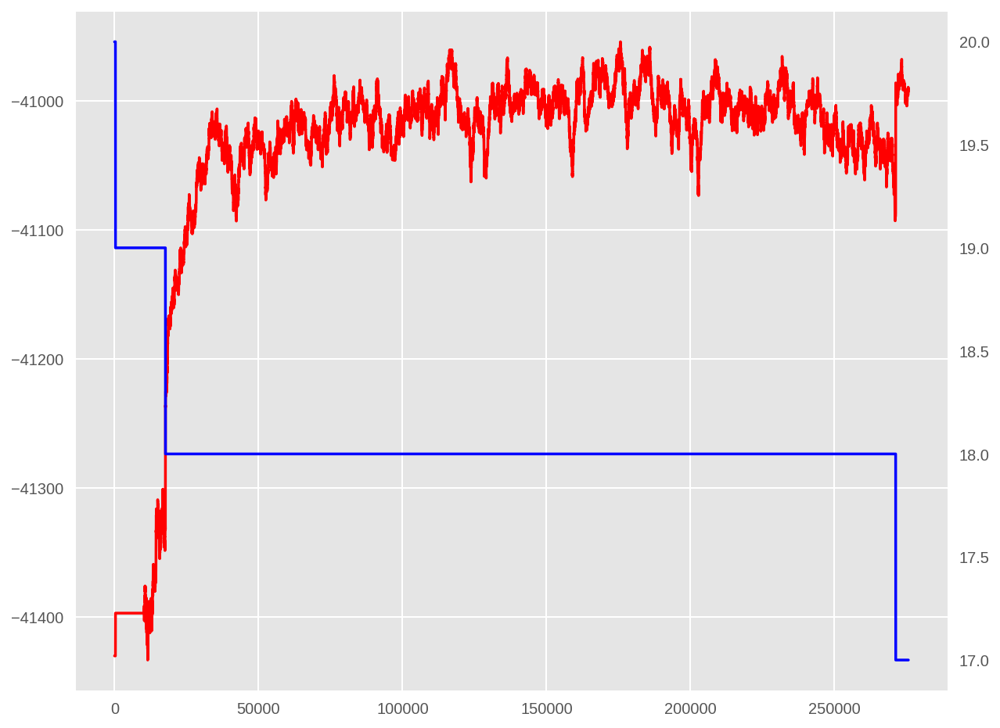

In [426]:
cv.plot_transition()

### large

In [427]:
from dpmm_standalone import *

In [ ]:
# Reload module
import dpmm_standalone
importlib.reload(dpmm_standalone)
from dpmm_standalone import *

In [428]:
clustering = load_clustering("clustering.large.sm.gibbs.pkl")

[INFO] loaded clustering
[INFO] alpha = 1.000000, N = 11661, L = 90, 34160000 iterations so far
[INFO] # of clusters = 89 (max posterior), 89 (current)


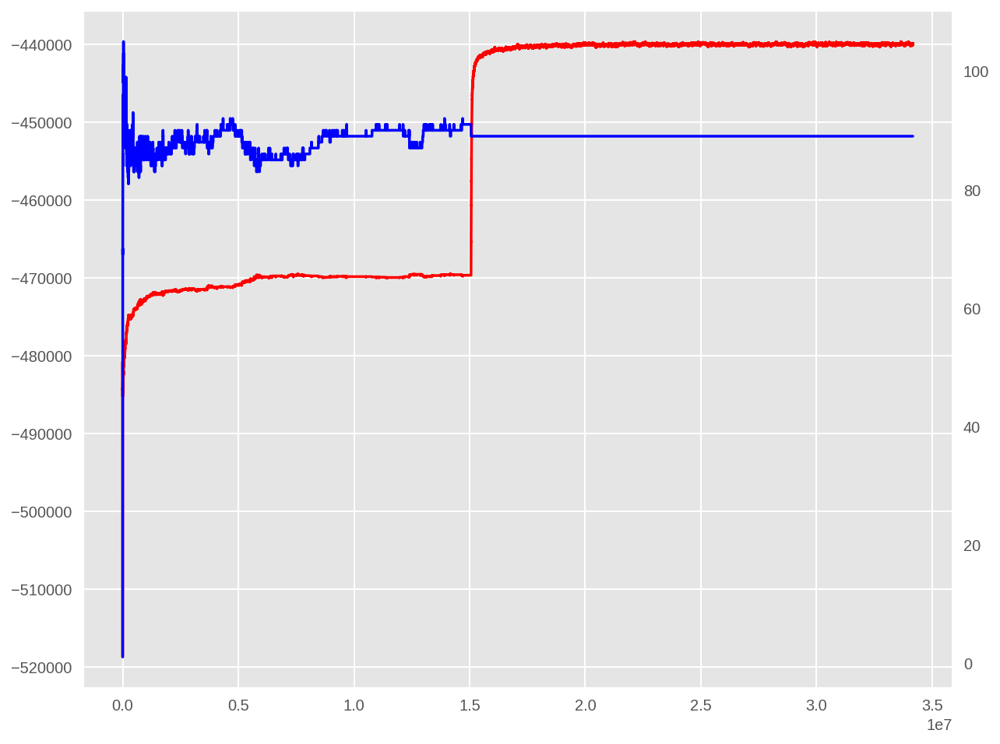

In [429]:
clustering.plot_transition()

In [430]:
clustering.r_units = {}
for c_idx in set(clustering.max_s):                                                                                                                                                                          
    cluster_units = clustering.x[np.where(clustering.max_s == c_idx)[0], :]                                                                                                                                  
    cluster_size = cluster_units.shape[0]                                                                                                                                                                   
    clustering.r_units[c_idx] = np.where(np.sum(cluster_units, axis=0) >= cluster_size // 2, 1, 0)                                                                                                                

In [581]:
# Heatmap of a single cluster specified by c_idx                                                                                                                                                                
def heatmap_cluster(clustering, c_idx, figsize=(8, 6)):                                                                                                                                                               
    plt.subplots(figsize=figsize)                                                                                                                                                                               
    sns.heatmap(clustering.x[np.where(clustering.max_s == c_idx)[0], :], cbar=False)                                                                                                       
    plt.show()                                                                                                                                                                                                  

# Distinct heatmaps of all clusters                                                                                                                                                                             
def heatmap_clusters(clustering, figsize=(8, 6)):                                                                                                                                                                     
    for c_idx in set(clustering.max_s):                                                                                                                                                               
        heatmap_cluster(clustering, c_idx, figsize)                                                                                                                                                                    

# Dendrogram of the representative units by Hamming distance and Ward's method                                                                                                                                  
def dendrogram_representatives(clustering):                                                                                                                                                                           
    hc_result = linkage(pdist(list(clustering.r_units.values()), metric='hamming'), method='ward')                                                                                                         
    plt.figure(figsize=(18, 10))                                                                                                                                                                                
    dendrogram(hc_result)                                                                                                                                                                                       
    plt.show()                                                                                                                                                                                                  

# Scatter plot of raw units as 2D Hamming kernel PCA                                                                                                                                                            
def scatter_units(clustering, figsize=(12, 12)):                                                                                                                                                                      
    # Add representative units into the variant matrix                                                                                                                                                          
    vm = clustering.x.copy()                                                                                                                                                                         
    rm = np.zeros((len(clustering.r_units), clustering.L), dtype=int)                                                                                                                                 
    for i, r_unit in enumerate(sorted(clustering.r_units.items(), key=lambda x: x[0])):                                                                                                                    
        rm[i] = r_unit[1]   # add in ascending order of cluster index                                                                                                                                           
    data = np.concatenate((vm, rm), axis=0)                                                                                                                                                                     

    coord = KernelPCA(n_components=2, kernel='precomputed').fit_transform(1 - squareform(pdist(data, metric='hamming')))                                                                                        

    # NOTE: ordinary PCA gives almost same result because of sparsity                                                                                                                                           
    #coord = PCA(n_components=2).fit_transform(data)                                                                                                                                                            

    fig, ax = plt.subplots(figsize=figsize)                                                                                                                                                                     
    for i, c_idx in enumerate(sorted(list(set(clustering.max_s)))):                                                                                                                                   
        col = "#%06X" % (int(0xFFFFFF / (len(set(clustering.max_s)) - 1) * i))                                                                                                                        
        #ax.scatter(coord[np.where(clustering.max_s == c_idx)[0], 0], coord[np.where(clustering.max_s == c_idx)[0], 1], s=10, c=col, label=str(c_idx), marker=".")                                 
        ax.scatter(coord[-(len(clustering.r_units) - i), 0], coord[-(len(clustering.r_units) - i), 1], s=500, c=col, marker="$%s$" % c_idx)   # representative units                                                                
    ax.legend(loc="upper right", bbox_to_anchor=(1.15, 1.0), prop={"size": 12})                                                                                                                                 
    plt.show()                                                                                                                                                           

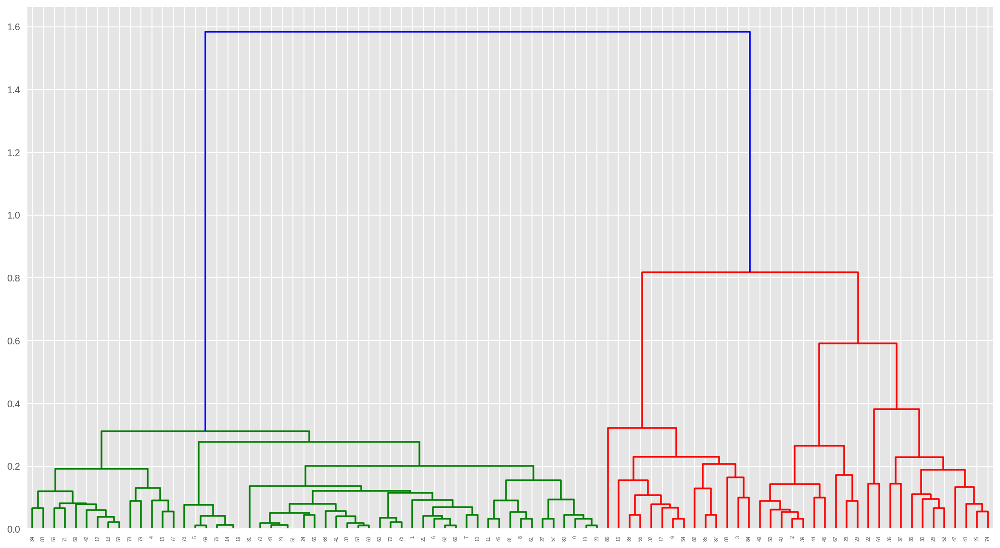

In [432]:
dendrogram_representatives(clustering)

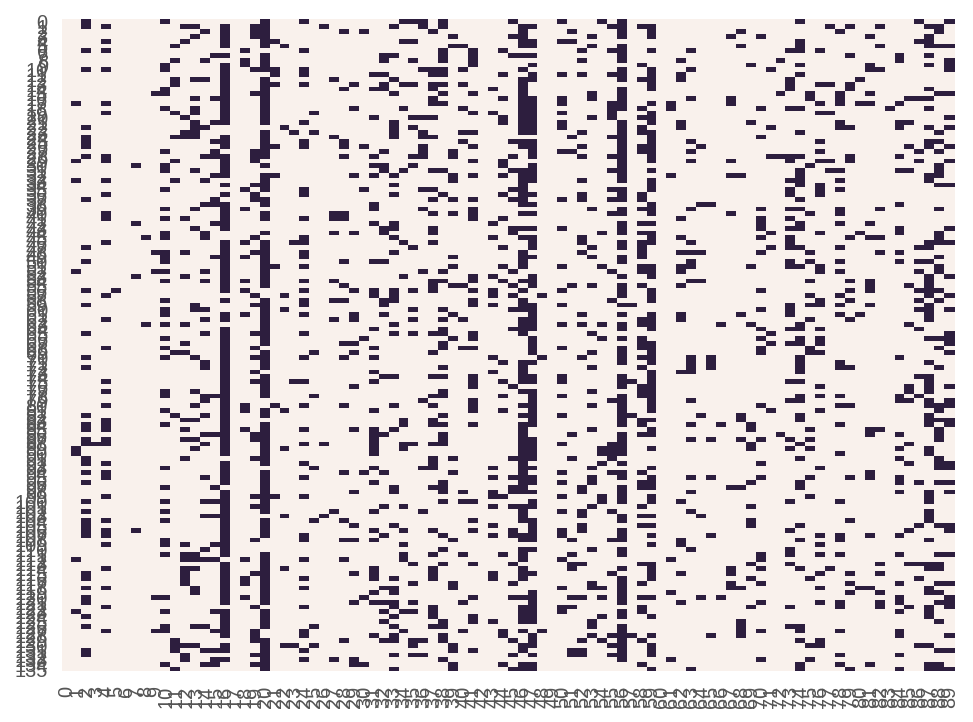

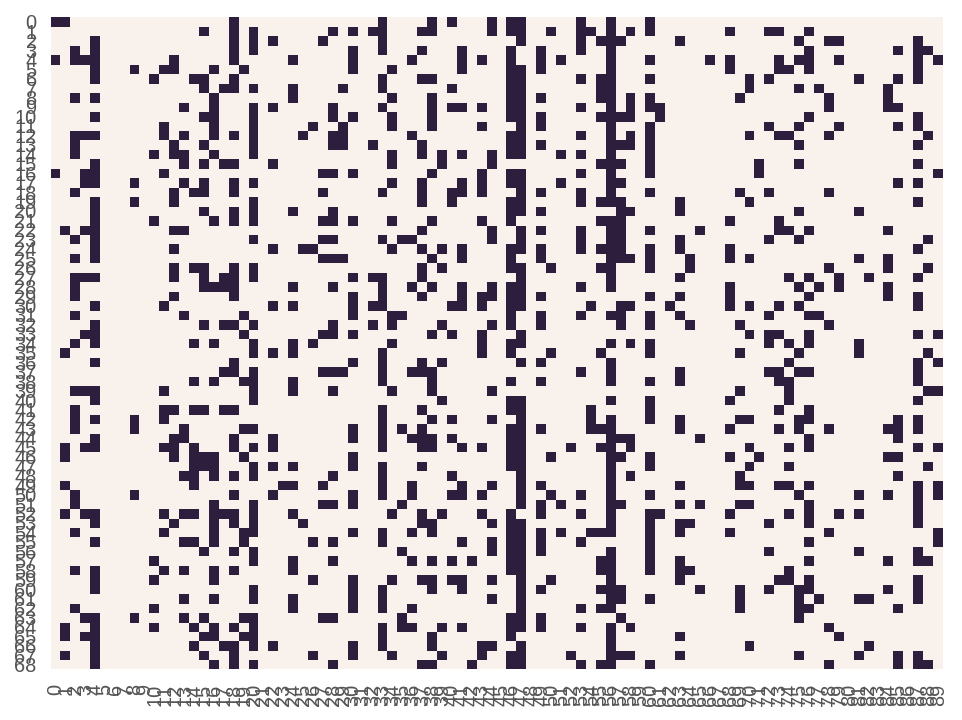

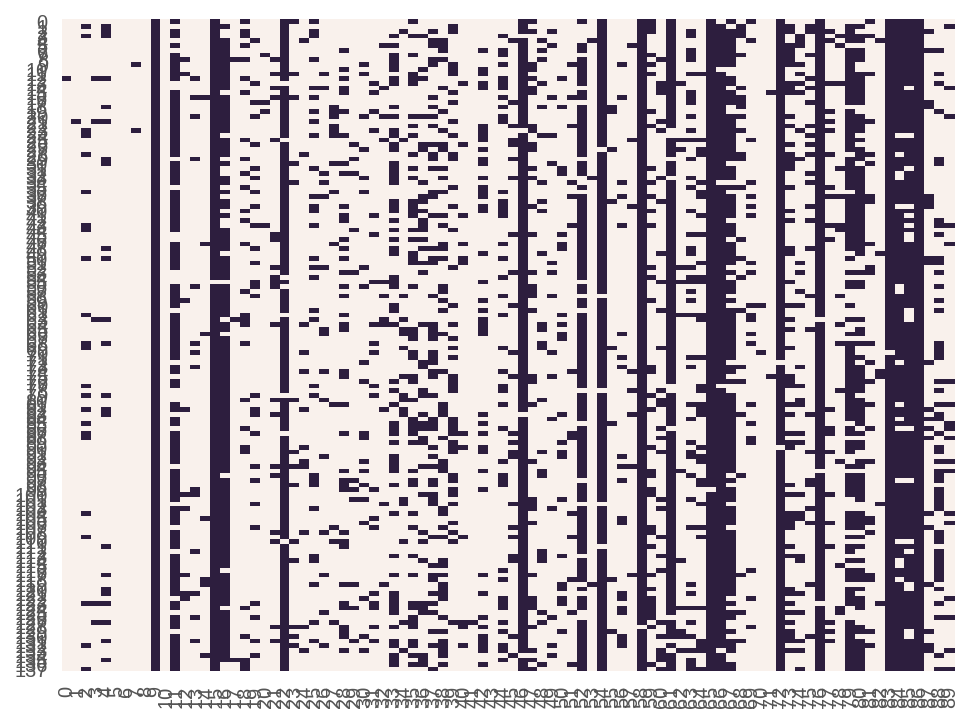

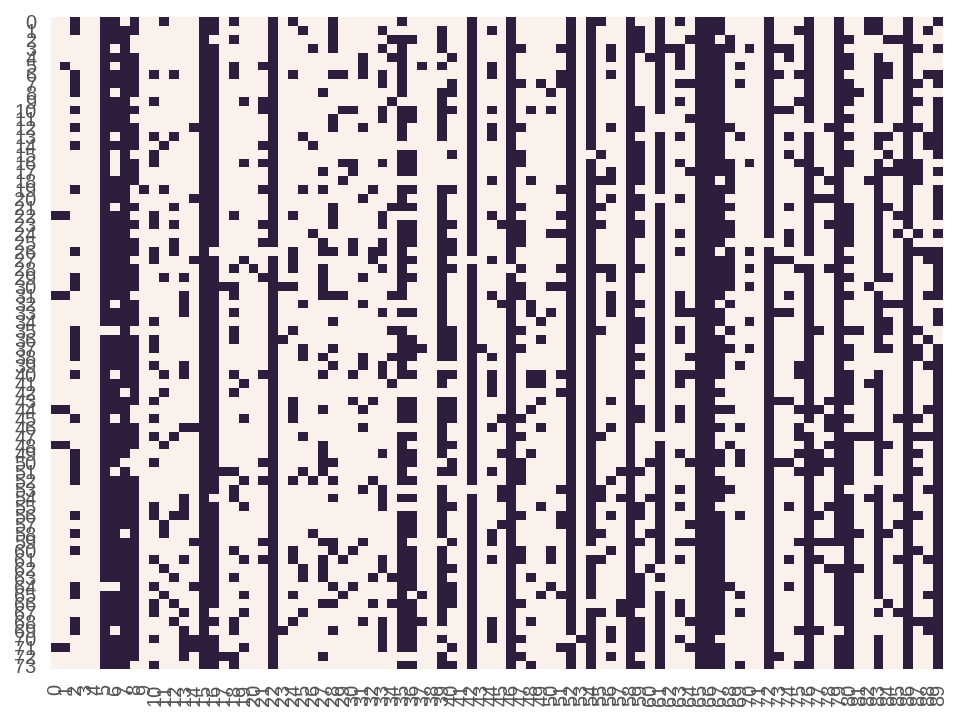

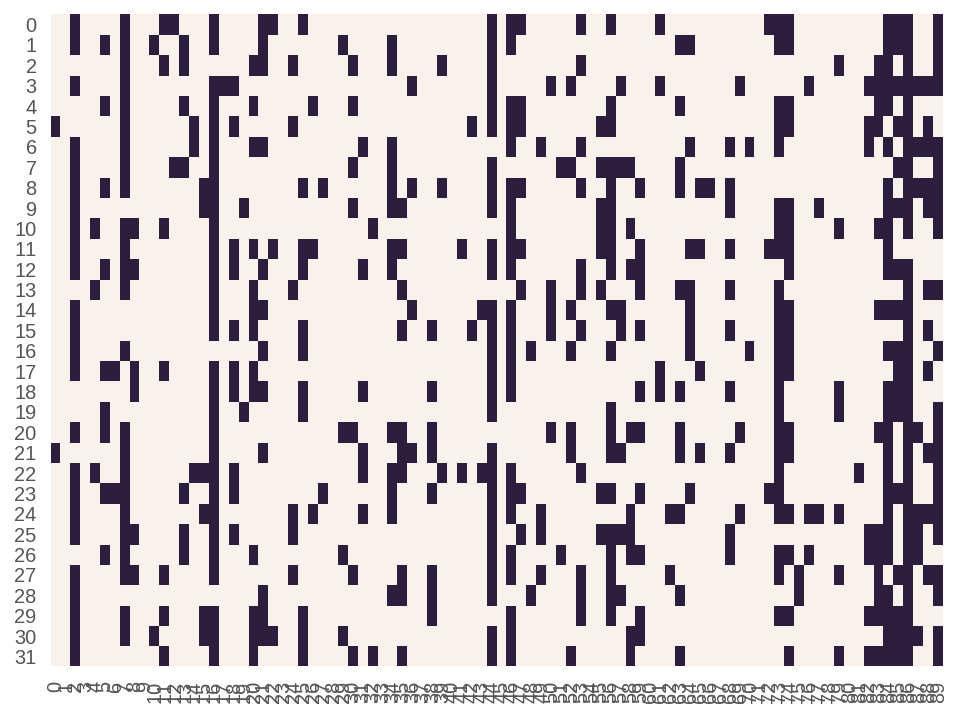

...

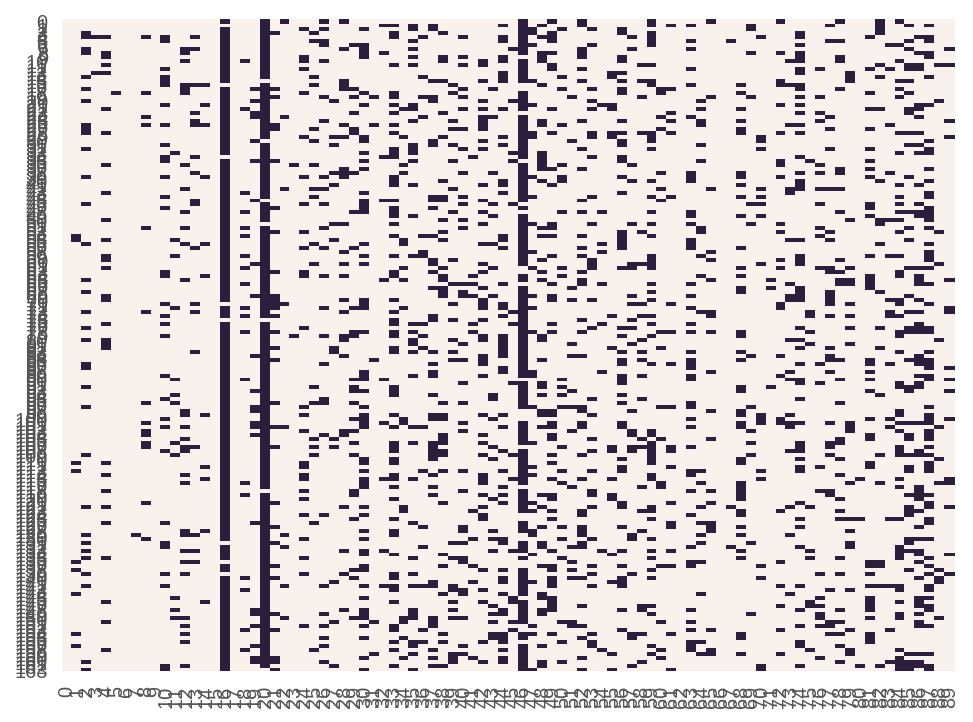

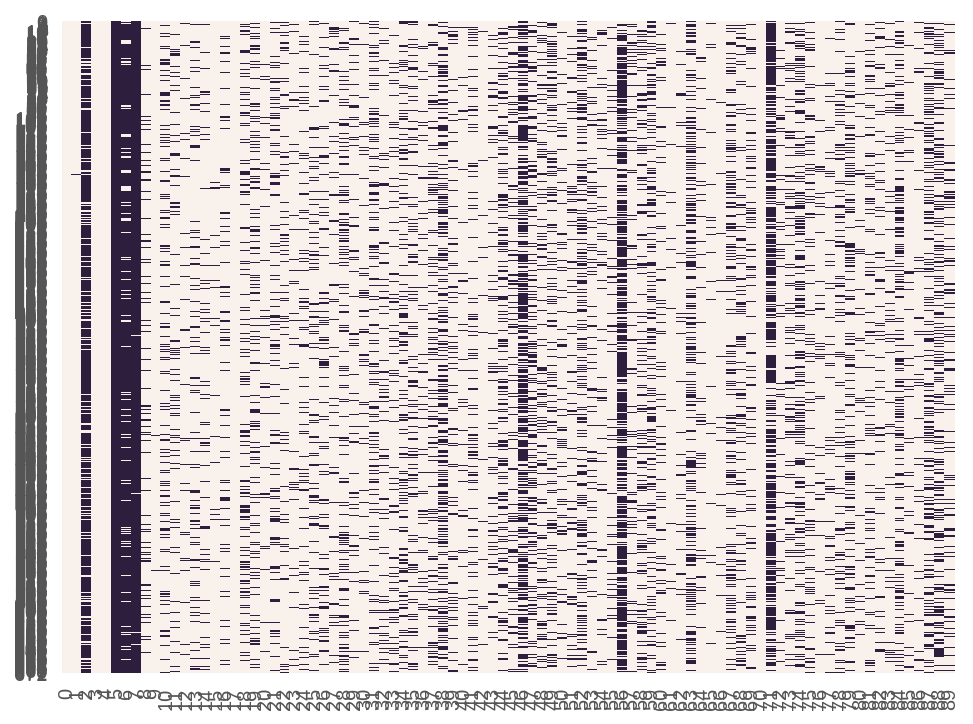

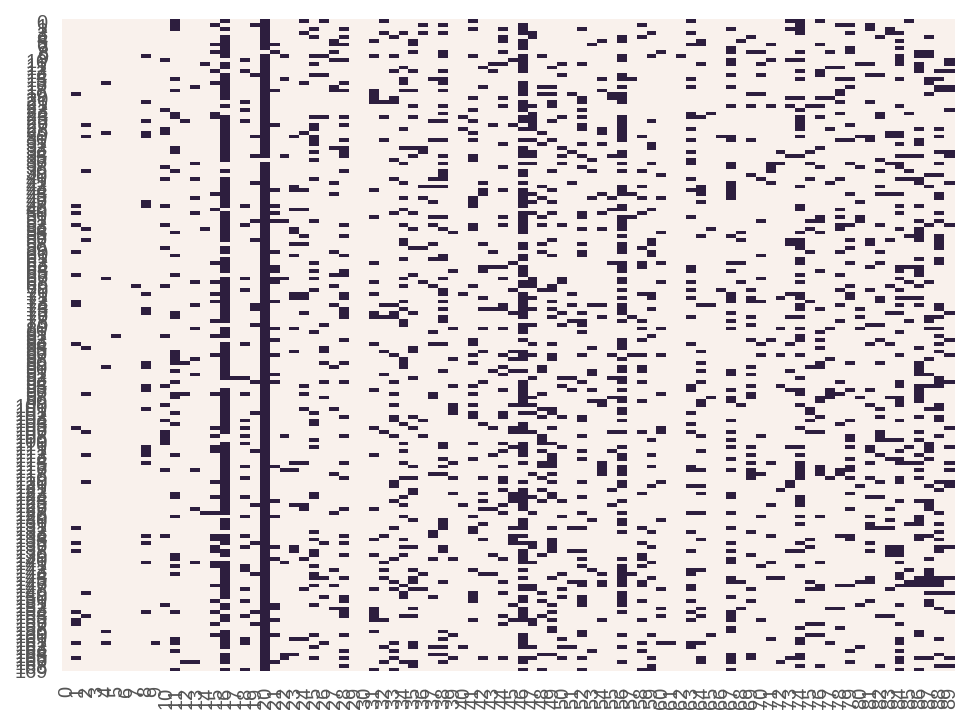

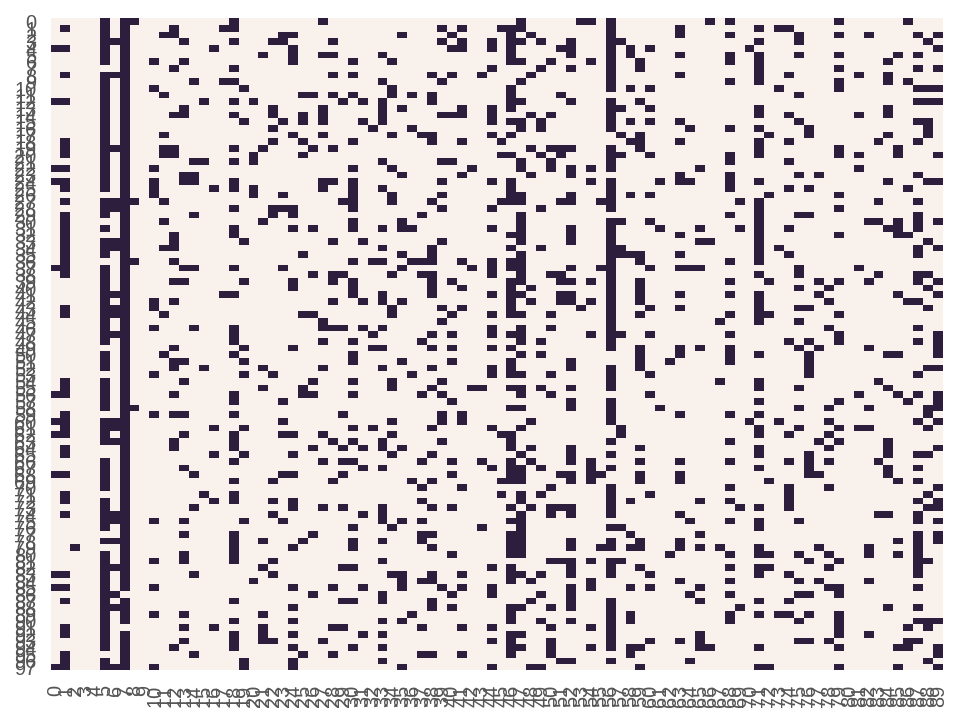

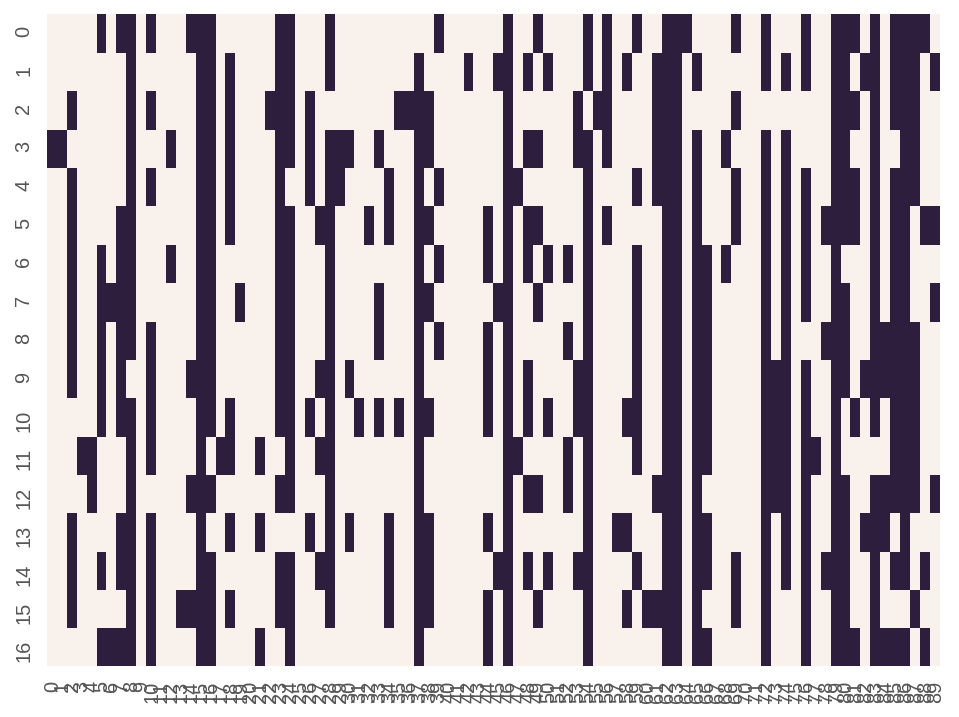

KeyboardInterrupt: 

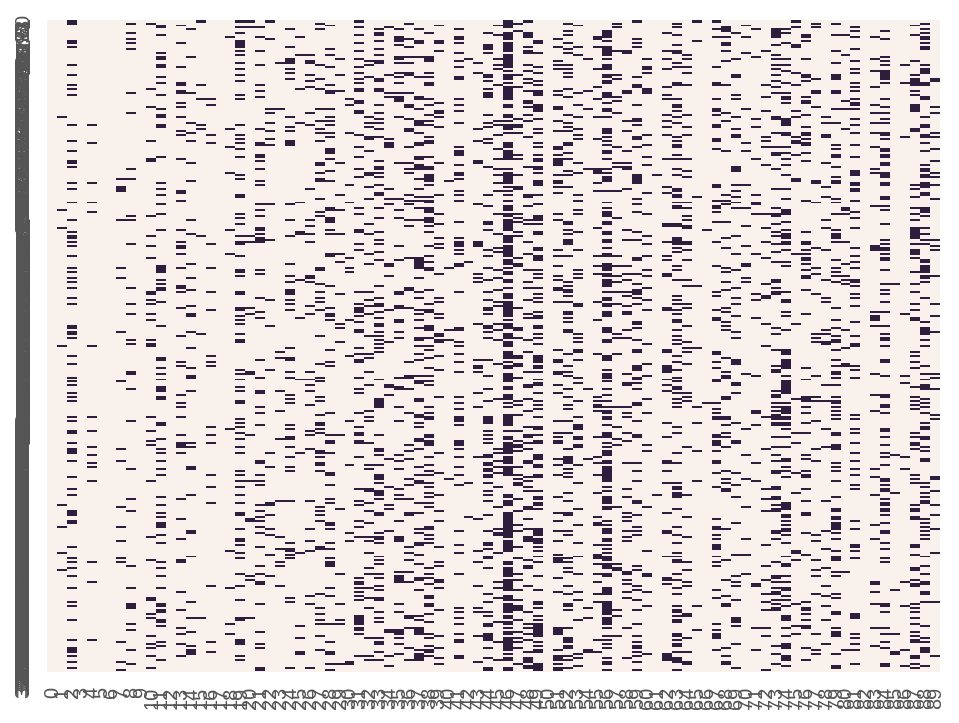

In [433]:
heatmap_clusters(clustering)

/home/ysuzuki/work/.pyenv/versions/anaconda3-4.4.0/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning:

No labelled objects found. Use label='...' kwarg on individual plots.



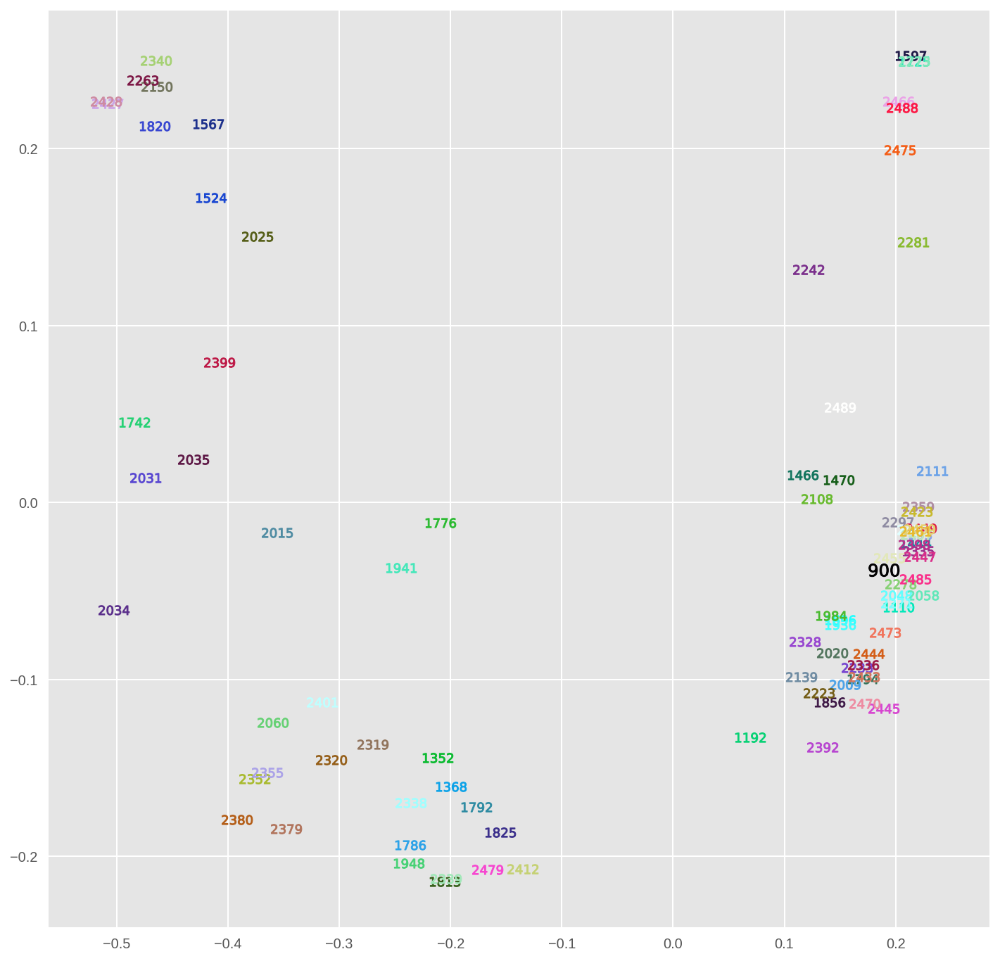

In [582]:
scatter_units(clustering)

### experiment

In [10]:
def generate_data(r, n):
    data = np.full((n, len(r)), 0, dtype=int)
    for i in range(n):
        d = r.copy()
        for j in range(len(d)):
            if d[j] == 1:
                if random.random() <= pe:
                    d[j] = 0
            elif d[j] == 0:
                if random.random() <= pe:# / 3:
                    d[j] = 1
        data[i, :] = d
    return data

In [11]:
r1 = []
for i in range(100):
    if random.random() < 0.3:
        r1.append(1)
    else:
        r1.append(0)
pe = 0.15
r1 = np.array(r1)

In [12]:
ndiff = 5

r2 = r1.copy()
r2[10:10+ndiff] = 1 - r1[10:10+ndiff]
r3 = r1.copy()
r3[50:50+ndiff] = 1 - r1[50:50+ndiff]

In [13]:
data = np.concatenate((generate_data(r1, 100), generate_data(r2, 100), generate_data(r3, 100)), axis = 0)

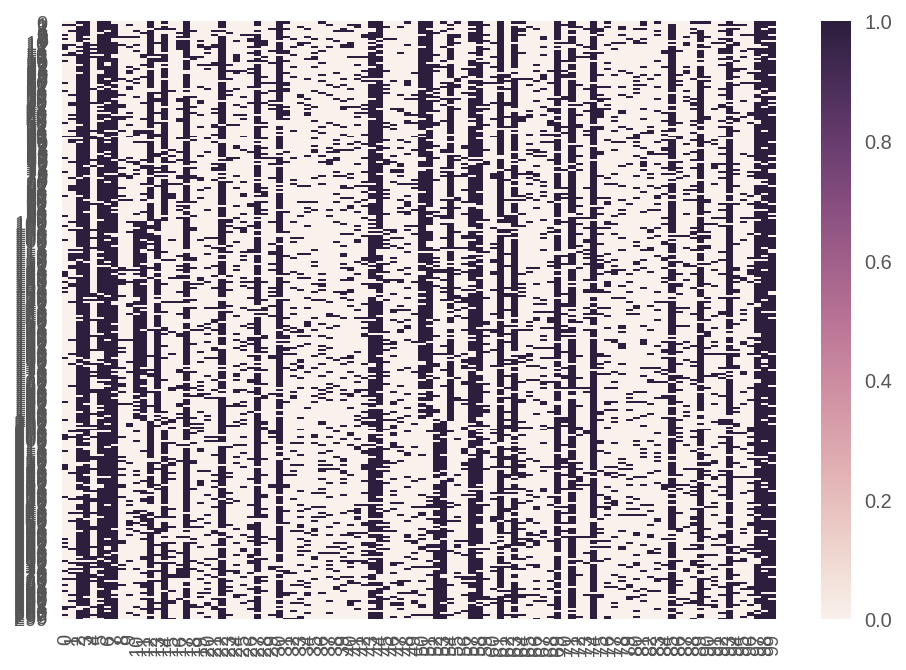

In [14]:
sns.heatmap(data)

In [15]:
assignment = np.array([0] * 100 + [1] * 100 + [2] * 100)

In [16]:
r_units = {0: r1, 1: r2, 2: r3}

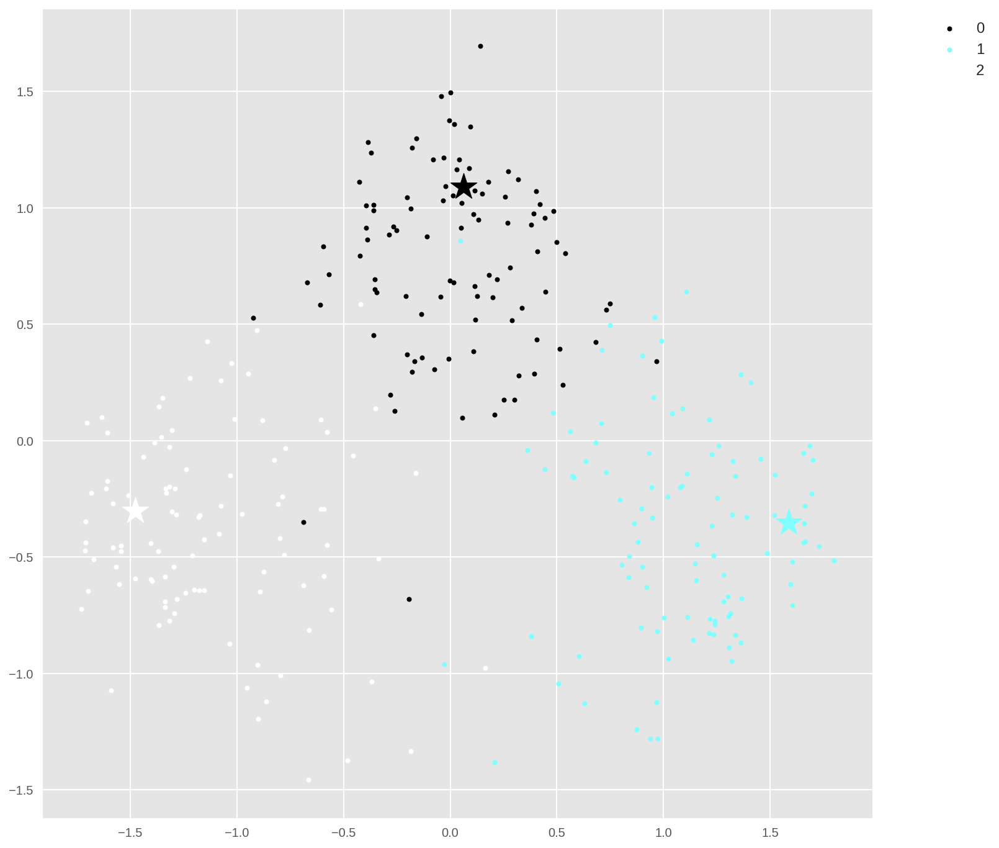

In [17]:
# Add representative units into the variant matrix                                                                                                                                                          
vm = data.copy()                                                                                                                                                                         
rm = np.zeros((3, 100), dtype=int)                                                                                                                                 
for i, r_unit in enumerate(sorted(r_units.items(), key=lambda x: x[0])):                                                                                                                    
    rm[i] = r_unit[1]   # add in ascending order of cluster index                                                                                                                                           
data_ = np.concatenate((vm, rm), axis=0)                                                                                                                                                                     

#coord = KernelPCA(n_components=2, kernel='precomputed').fit_transform(1 - squareform(pdist(data_, metric='hamming')))                                                                                        

# NOTE: ordinary PCA gives almost same result because of sparsity                                                                                                                                           
coord = PCA(n_components=2).fit_transform(data_)                                                                                                                                                            

fig, ax = plt.subplots(figsize=(12, 12))                                                                                                                                                                     
for i, c_idx in enumerate(sorted(list(set(assignment)))):                                                                                                                                   
    col = "#%06X" % (int(0xFFFFFF / (len(set(assignment)) - 1) * i))                                                                                                                        
    ax.scatter(coord[np.where(assignment == c_idx)[0], 0], coord[np.where(assignment == c_idx)[0], 1], c=col, label=str(c_idx), marker=".")                                 
    ax.scatter(coord[-(len(r_units) - i), 0], coord[-(len(r_units) - i), 1], s=500, c=col, marker="*")   # representative units                                                                
ax.legend(loc="upper right", bbox_to_anchor=(1.15, 1.0), prop={"size": 12})                                                                                                                                 
plt.show()                                                                                                                                                           

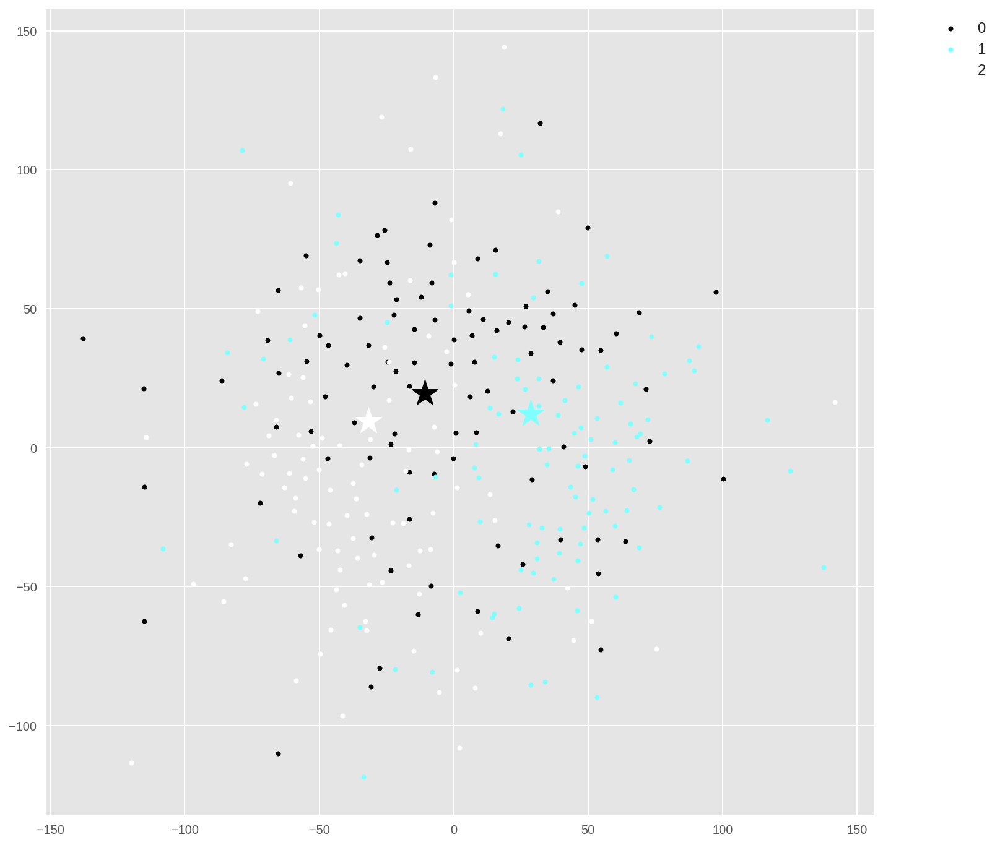

In [21]:
# Add representative units into the variant matrix                                                                                                                                                          
vm = data.copy()                                                                                                                                                                         
rm = np.zeros((3, 100), dtype=int)                                                                                                                                 
for i, r_unit in enumerate(sorted(r_units.items(), key=lambda x: x[0])):                                                                                                                    
    rm[i] = r_unit[1]   # add in ascending order of cluster index                                                                                                                                           
data_ = np.concatenate((vm, rm), axis=0)                                                                                                                                                                     

#coord = KernelPCA(n_components=2, kernel='precomputed').fit_transform(1 - squareform(pdist(data_, metric='hamming')))                                                                                        

# NOTE: ordinary PCA gives almost same result because of sparsity                                                                                                                                           
#coord = PCA(n_components=2).fit_transform(data_)                                                                                                                                                            
coord = manifold.TSNE(n_components=2, perplexity=50).fit_transform(data_)

fig, ax = plt.subplots(figsize=(12, 12))                                                                                                                                                                     
for i, c_idx in enumerate(sorted(list(set(assignment)))):                                                                                                                                   
    col = "#%06X" % (int(0xFFFFFF / (len(set(assignment)) - 1) * i))                                                                                                                        
    ax.scatter(coord[np.where(assignment == c_idx)[0], 0], coord[np.where(assignment == c_idx)[0], 1], c=col, label=str(c_idx), marker=".")                                 
    ax.scatter(coord[-(len(r_units) - i), 0], coord[-(len(r_units) - i), 1], s=500, c=col, marker="*")   # representative units                                                                
ax.legend(loc="upper right", bbox_to_anchor=(1.15, 1.0), prop={"size": 12})                                                                                                                                 
plt.show()                                                                                                                                                           

### monover encoding

* read ID, unit ID (in the read)
* strand (against assigned representative ID)
* start/end pos in the read
* assigned representative monover ID (including peak ID)
* % identity against repr.

unit format
```
>[READ_ID]/[UNIT_ID]/[START]_[END]
```

aligned unit format
```
>[READ_ID]/[UNIT_ID]/[START]_[END]    [PEAK_ID]:[MONOVER_ID]    START=[ALIGNED_START_POS]
```

# TODO:

* Use k-monomer
* Adopt another clustering method that can finish calculation in affordable time (can classify into chromosome-level monomers or like that)